<a href="https://colab.research.google.com/github/PavloZakala/CV_2024/blob/main/CV_histogram%2C_image_correction%2C_filtering.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

root_path = 'gdrive/My Drive/CV/'


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


(353, 530, 3)
(227, 340, 3)


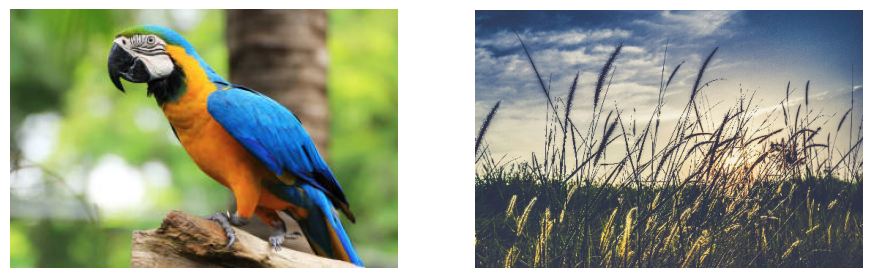

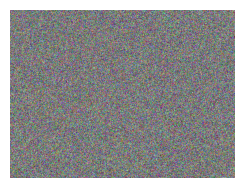

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

parrot_image = plt.imread(os.path.join(root_path, r"images/parrot.jpg"))
low_contrast_image = plt.imread(os.path.join(root_path, r"images/low_contrast.jpg"))
low_contrast_image = cv2.resize(low_contrast_image,
                (low_contrast_image.shape[1] // 8, low_contrast_image.shape[0] // 8))

random_gray_image = ((np.random.randn(480, 640, 3) + 0.5) * 100).astype(np.uint8)

print(low_contrast_image.shape)
print(parrot_image.shape)

plt.figure(figsize=(11, 11))
plt.subplot(2, 2, 1)
plt.imshow(parrot_image)
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(low_contrast_image)
plt.axis('off')
plt.show()

plt.subplot(2, 2, 3)
plt.imshow(random_gray_image)
plt.axis('off')
plt.show()

# Histogram

Як будується гістограма

![picture](https://www.baeldung.com/wp-content/uploads/sites/4/2022/09/ArrowHisto.png)

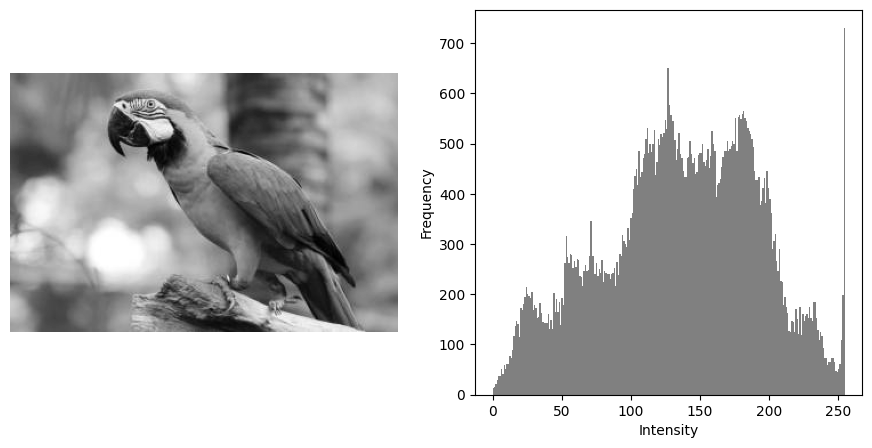

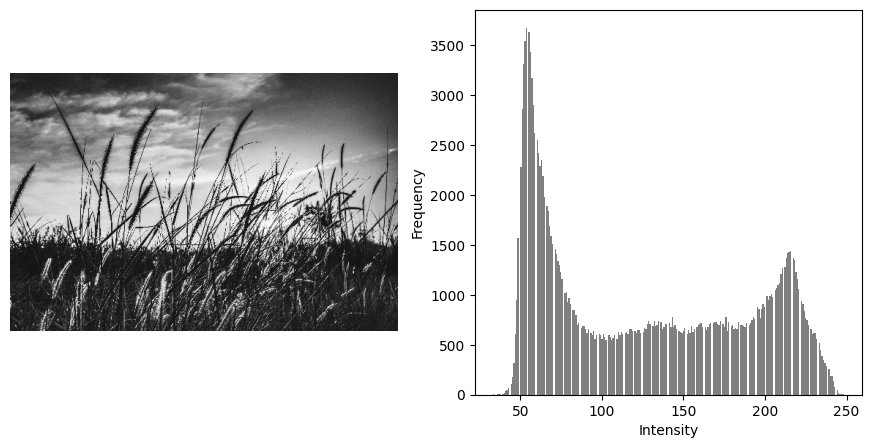

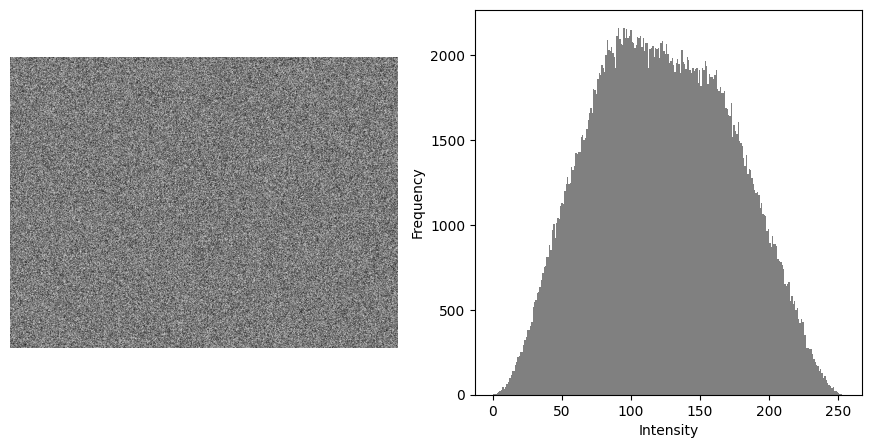

In [ ]:
def draw_gray_image_and_hist(gray_image, n_bins=255):
  plt.figure(figsize=(11, 5))
  plt.subplot(1, 2, 1)
  plt.imshow(gray_image, cmap="gray")
  plt.axis('off')

  plt.subplot(1, 2, 2)
  plt.hist(gray_image.reshape(-1), bins=n_bins, color="gray")
  plt.xlabel("Intensity")
  plt.ylabel("Frequency")
  plt.show()

n_bins = 256 # # 25, 100, 255

for image in [parrot_image, low_contrast_image, random_gray_image]:
  gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

  draw_gray_image_and_hist(gray_image, n_bins=n_bins)

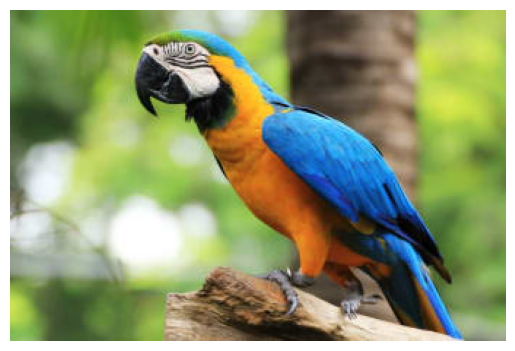

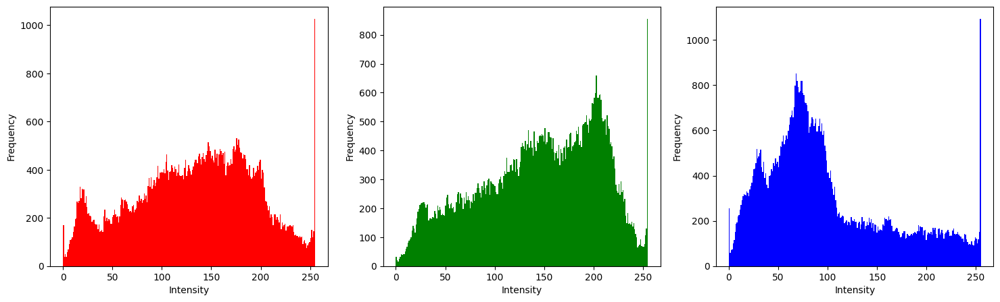

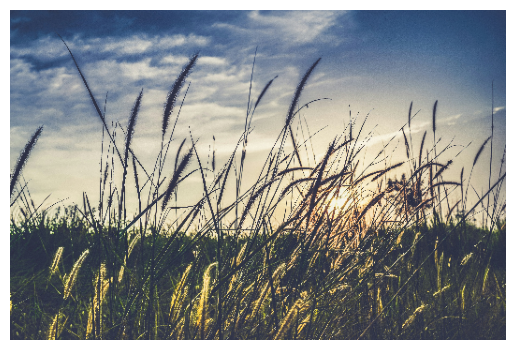

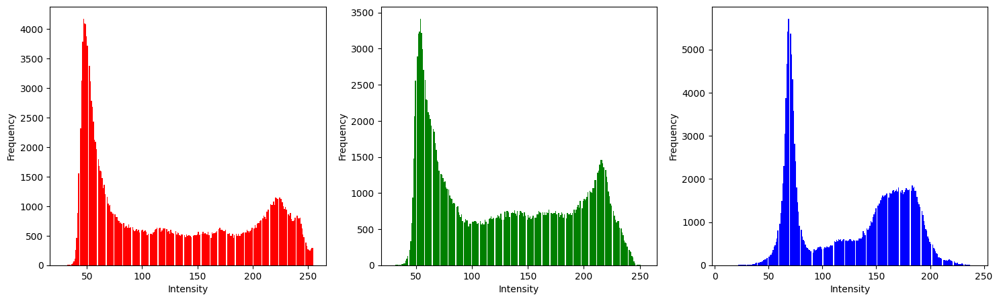

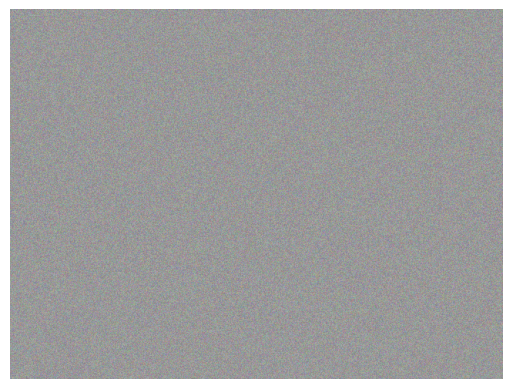

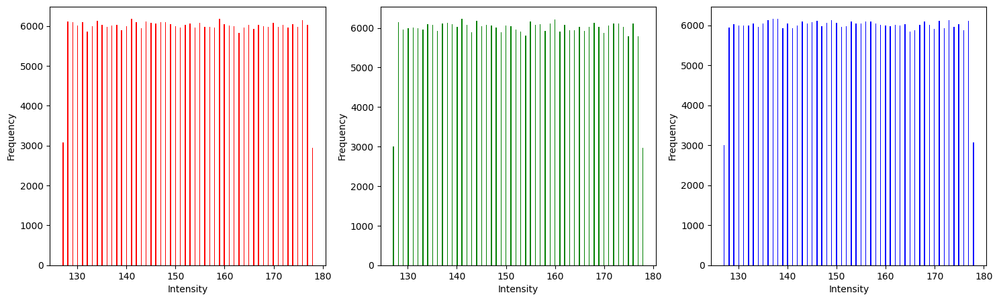

In [ ]:
def split_image(image):
  return image[:, :, 0], image[:, :, 1], image[:, :, 2]

def draw_color_image_and_hist(image, n_bins=255):
  plt.imshow(image)
  plt.axis('off')
  plt.show()

  # Split by color channel
  r, g, b = split_image(image)

  plt.figure(figsize=(18, 5))
  plt.subplot(1, 3, 1)
  plt.hist(r.reshape(-1), bins=n_bins, color="red")
  plt.xlabel("Intensity")
  plt.ylabel("Frequency")

  plt.subplot(1, 3, 2)
  plt.hist(g.reshape(-1), bins=n_bins, color="green")
  plt.xlabel("Intensity")
  plt.ylabel("Frequency")

  plt.subplot(1, 3, 3)
  plt.hist(b.reshape(-1), bins=n_bins, color="blue")
  plt.xlabel("Intensity")
  plt.ylabel("Frequency")
  plt.show()

n_bins = 256 # 25, 100, 255


# random_image = (np.minimum(1.0, np.maximum(0.0, np.random.randn(480, 640, 3) * 0.2 + 0.5)) * 255).astype(np.uint8)
random_image = (np.minimum(1.0, np.maximum(0.0, np.random.rand(480, 640, 3) * 0.2 + 0.5)) * 255).astype(np.uint8)

for image in [parrot_image, low_contrast_image, random_image]:
  draw_color_image_and_hist(image, n_bins=n_bins)

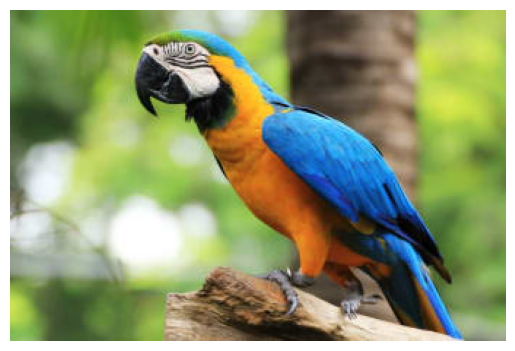

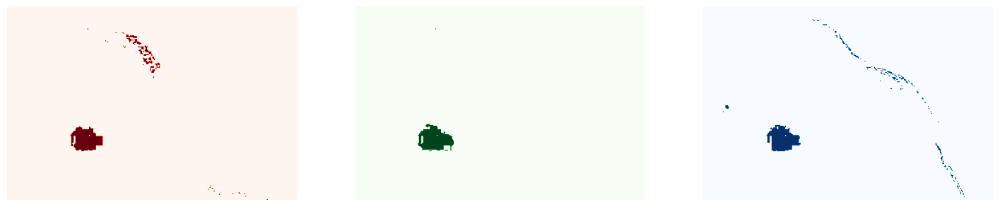

In [ ]:
alpha = 0.3
value_min = 255
value_max = 256

r, g, b = split_image(parrot_image)

r_map = (value_min <= r) & (r < value_max)
g_map = (value_min <= g) & (g < value_max)
b_map = (value_min <= b) & (b < value_max)

plt.imshow(parrot_image)
# plt.imshow(r_map, cmap="Reds", alpha=alpha)
# plt.imshow(g_map, cmap="Greens", alpha=alpha)
# plt.imshow(b_map, cmap="Blues", alpha=alpha)
plt.axis('off')
plt.show()

plt.figure(figsize=(18, 5))
plt.subplot(1, 3, 1)
plt.imshow(r_map.astype(np.float32), cmap="Reds")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(g_map.astype(np.float32), cmap="Greens")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(b_map.astype(np.float32), cmap="Blues")
plt.axis('off')

plt.show()

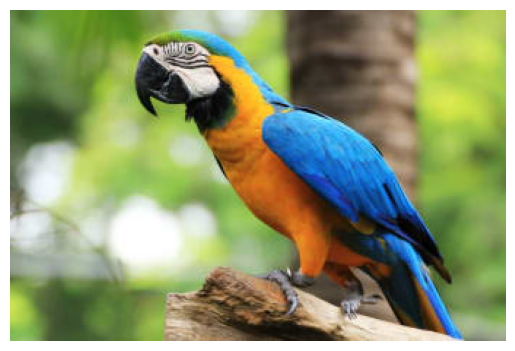

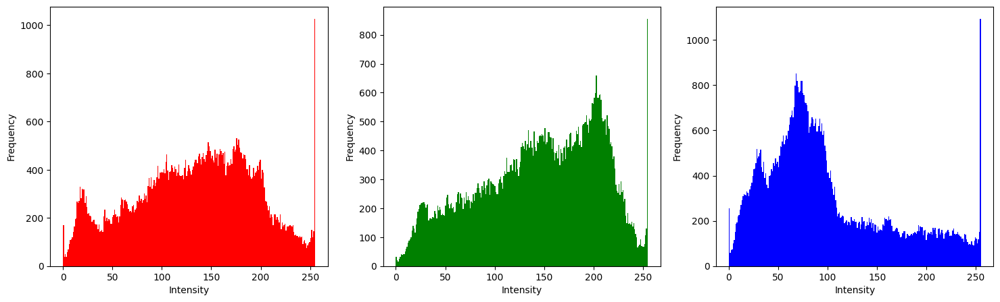

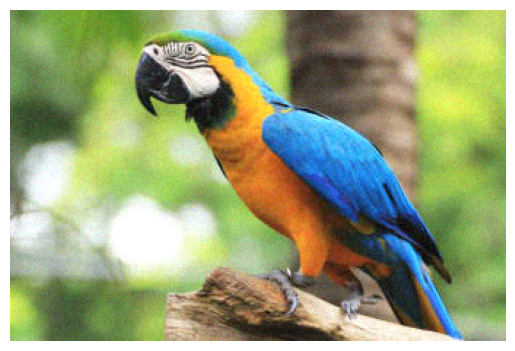

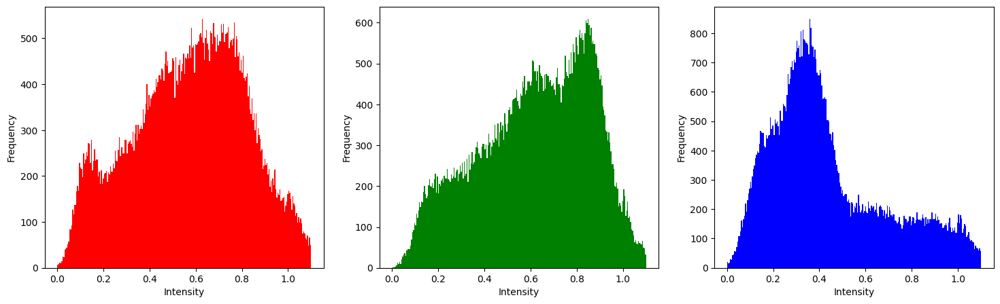

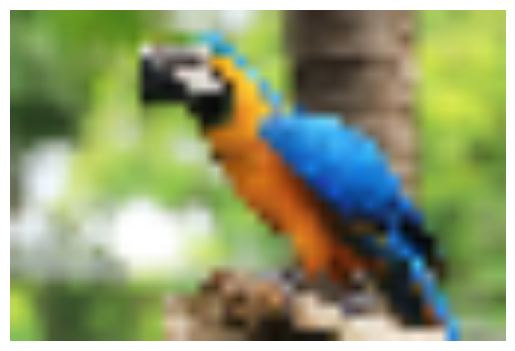

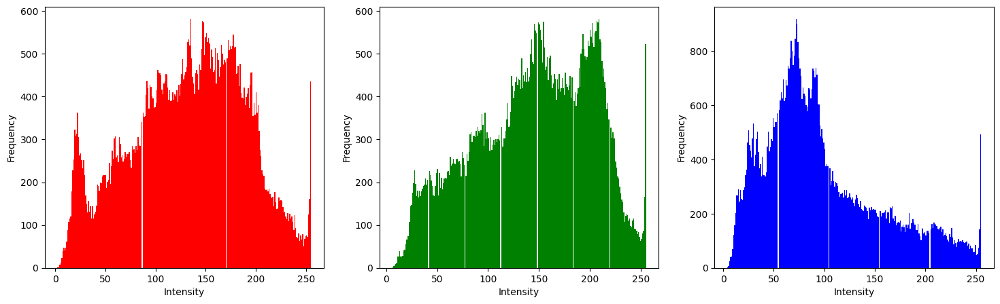

In [ ]:
n_bins = 256 # 25, 100, 255


image = parrot_image
draw_color_image_and_hist(image, n_bins=n_bins)

h, w, c = image.shape
image = image / 255 + np.random.rand(h, w, c) * 0.1
draw_color_image_and_hist(image, n_bins=n_bins)


image = cv2.resize(parrot_image, (parrot_image.shape[1] // 8, parrot_image.shape[0] // 8))
image = cv2.resize(image, (parrot_image.shape[1], parrot_image.shape[0]))

draw_color_image_and_hist(image, n_bins=n_bins)


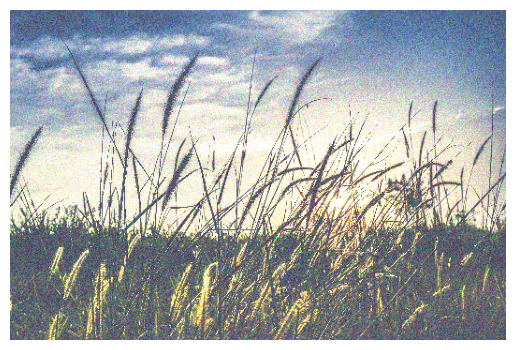

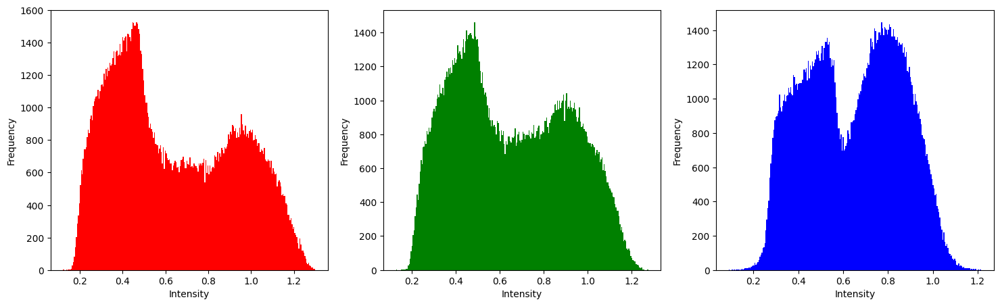

In [ ]:
n_bins = 255 # 25, 100, 255

image = low_contrast_image
h, w, c = image.shape
image = image / 255 + np.random.rand(h, w, c) * 0.3
draw_color_image_and_hist(image, n_bins=n_bins)

### Linear correction

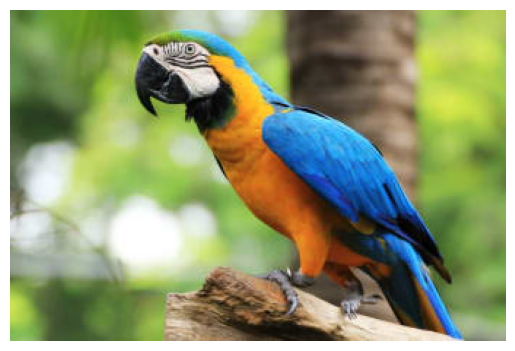

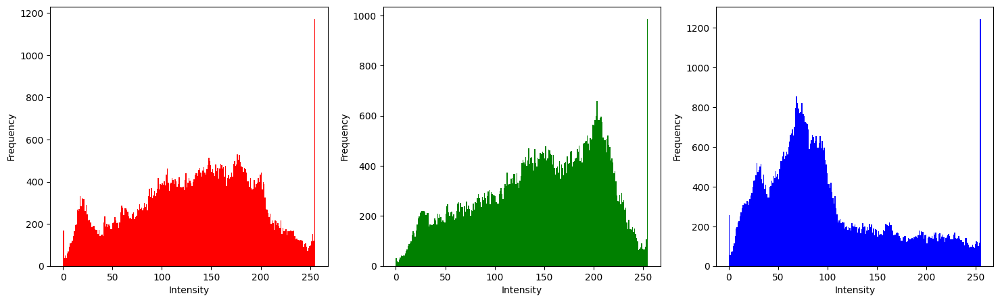

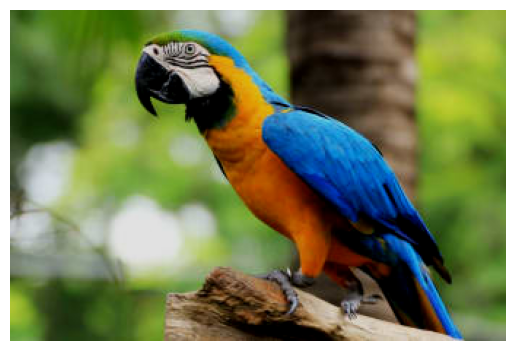

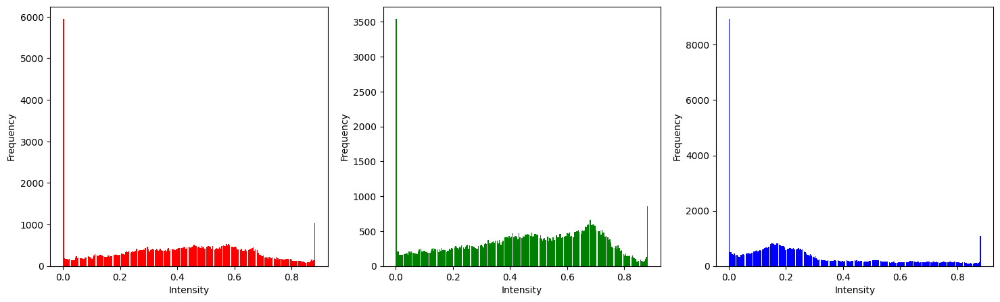

In [ ]:
# Brightness

def brightness_correction(image, brightness=0):
  return np.minimum(np.maximum(0.0, image - brightness), 1.0)

brightness =30  / 256.0
n_bins = 255 # 25, 100, 255

for image in [parrot_image]:
  draw_color_image_and_hist(image, n_bins=n_bins)
  image = brightness_correction(image / 255.0, brightness)
  draw_color_image_and_hist(image, n_bins=n_bins)

### NonLinear corection


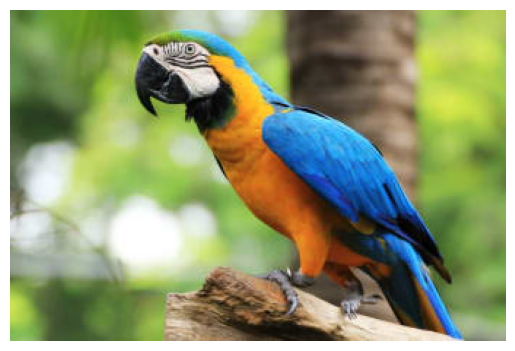

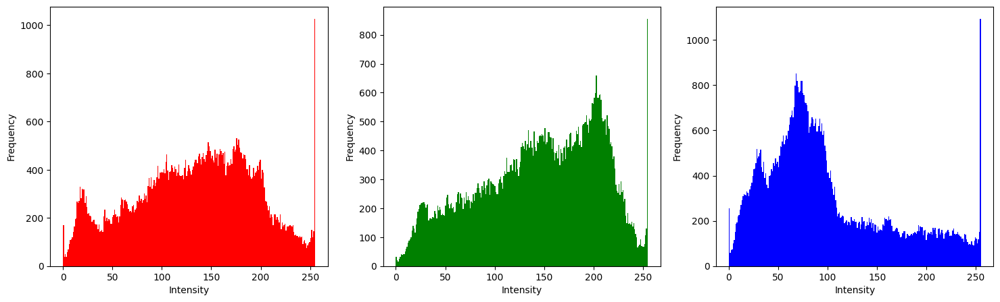

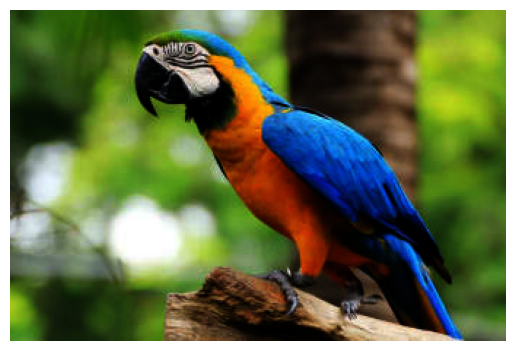

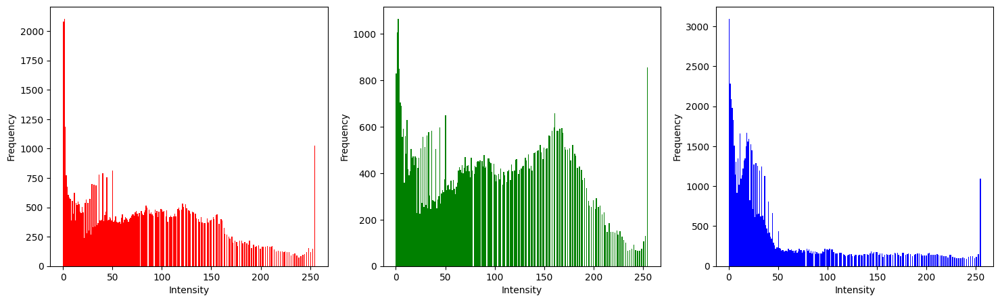

In [ ]:
import cv2

def adjust_gamma(image, gamma=1.0):
    # build a lookup table mapping the pixel values [0, 255] to
    # their adjusted gamma values
    invGamma = 1.0 / gamma
    table = np.array([((i / 255.0) ** invGamma) * 255
        for i in np.arange(0, 256)]).astype("uint8")
    # apply gamma correction using the lookup table
    return cv2.LUT(image, table)

gamma = 0.5

for image in [parrot_image]:

  draw_color_image_and_hist(image, n_bins=256)

  image = adjust_gamma(image, gamma)
  draw_color_image_and_hist(image, n_bins=256)

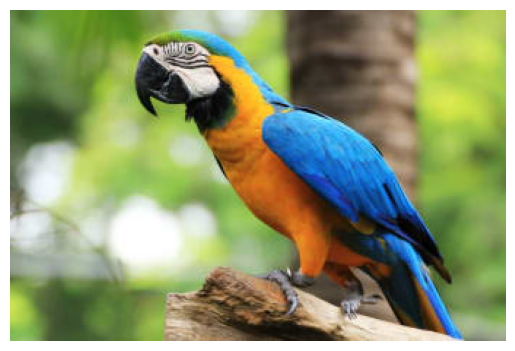

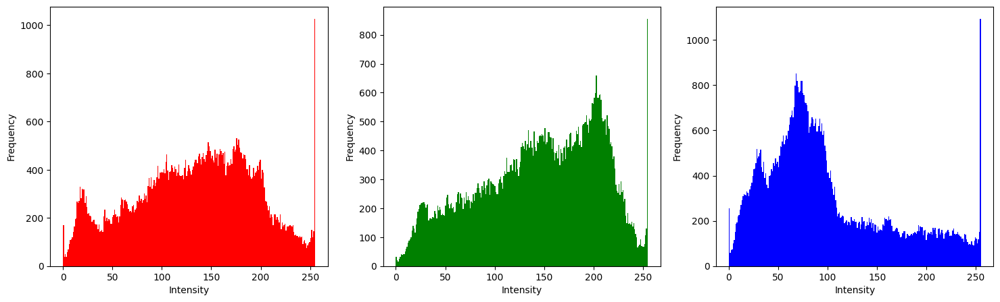

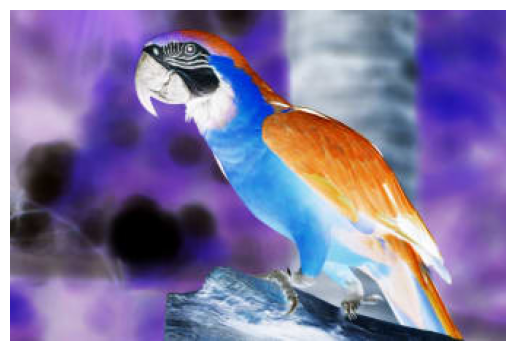

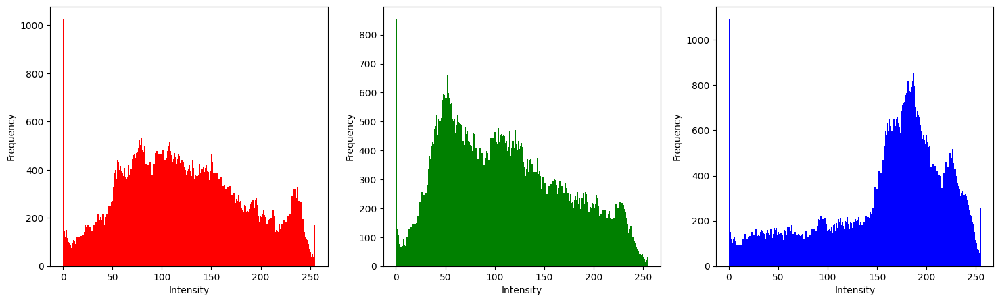

In [ ]:
for image in [parrot_image]:

  draw_color_image_and_hist(image, n_bins=256)

  image = 255 - image
  draw_color_image_and_hist(image, n_bins=256)

### Filters

Операція згортки

![picture](https://www.researchgate.net/publication/355656417/figure/fig2/AS:1083445656727555@1635324982803/Convolution-operation.png)

[[0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]]


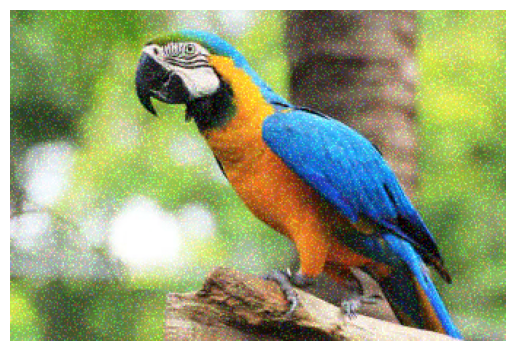

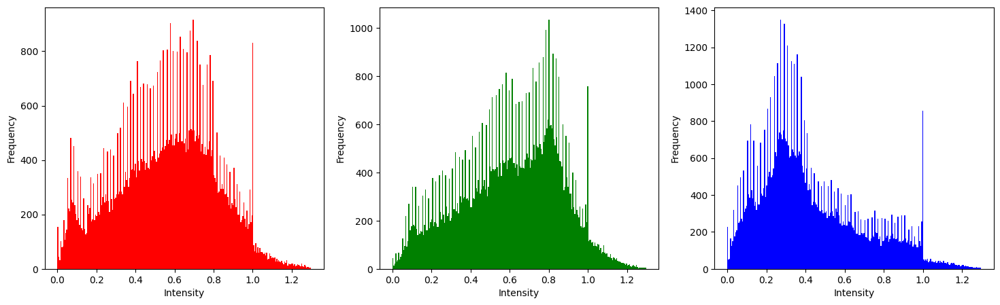

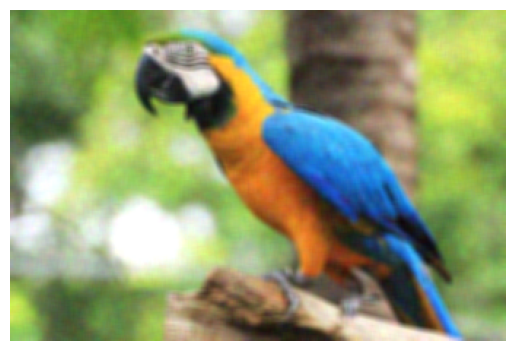

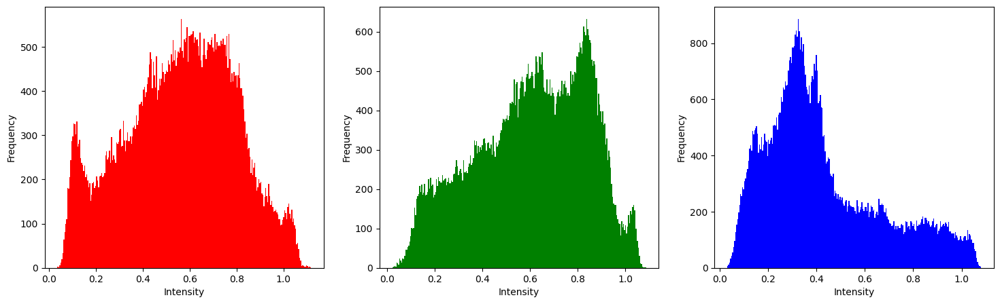

In [ ]:
from scipy import signal


def filter_by_kernal(image, kernal):
  filtered_image = []
  for channel in range(image.shape[2]):
    filtered_image.append(signal.convolve2d(image[:, :, channel], kernal, boundary='symm', mode='same'))

  filtered_image = np.stack(filtered_image, axis=2)

  return filtered_image

kernal = np.ones((5, 5))
kernal = kernal / (kernal.shape[0] *kernal.shape[1])

print(kernal)

for image in [parrot_image]:
  h, w, c = image.shape
  image = image / 255.0 + (np.random.rand(h, w, c) > 0.75) * np.random.rand(h, w, c) * 0.3
  draw_color_image_and_hist(image)
  filtered_image = filter_by_kernal(image, kernal)
  draw_color_image_and_hist(filtered_image)

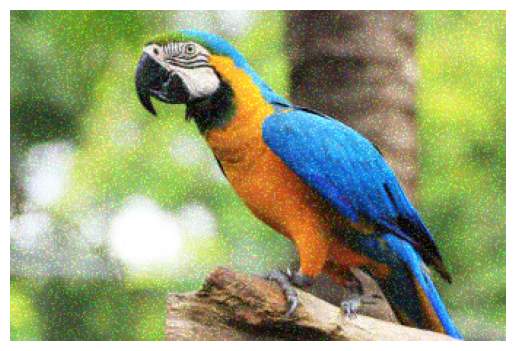

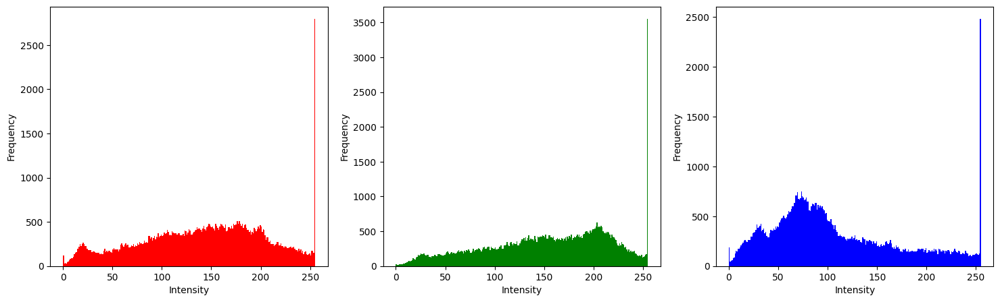

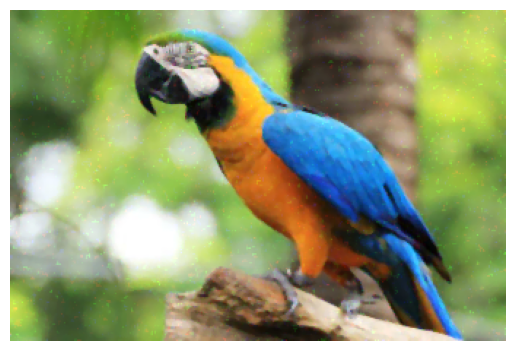

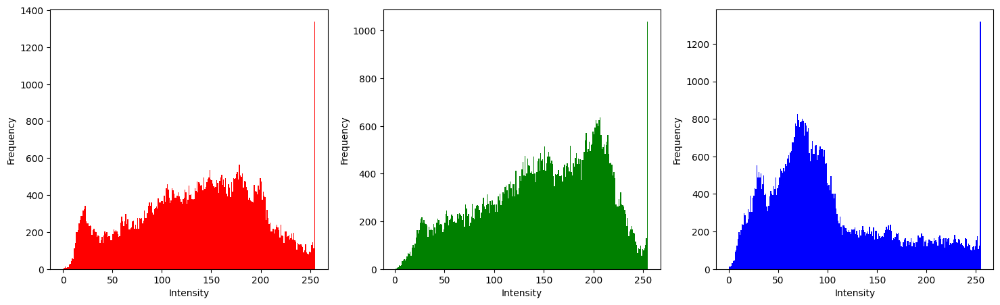

In [ ]:
for image in [parrot_image]:
  h, w, c = image.shape
  image = image * 1.0 + (np.random.rand(h, w, c) > 0.75) * np.random.rand(h, w, c) * 0.3 * 255.0
  image = np.minimum(255, np.maximum(image, 0)).astype(np.uint8)


  draw_color_image_and_hist(image)
  filtered_image = cv2.medianBlur(image, 3)
  draw_color_image_and_hist(filtered_image)

### Gaussian filter

[[0.00296902 0.01330621 0.02193823 0.01330621 0.00296902]
 [0.01330621 0.0596343  0.09832033 0.0596343  0.01330621]
 [0.02193823 0.09832033 0.16210282 0.09832033 0.02193823]
 [0.01330621 0.0596343  0.09832033 0.0596343  0.01330621]
 [0.00296902 0.01330621 0.02193823 0.01330621 0.00296902]]


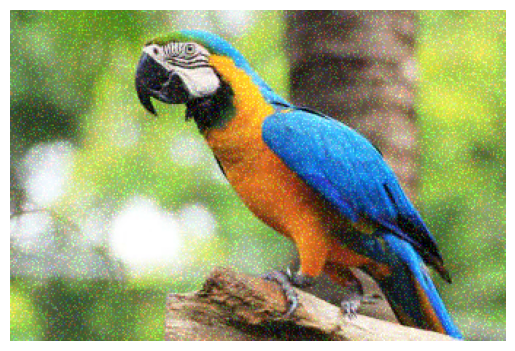

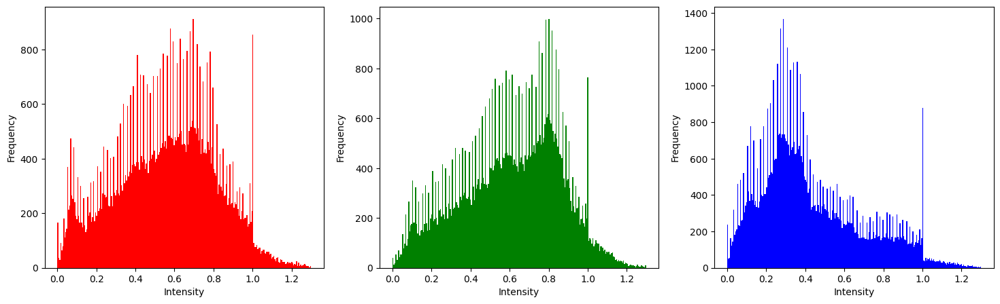

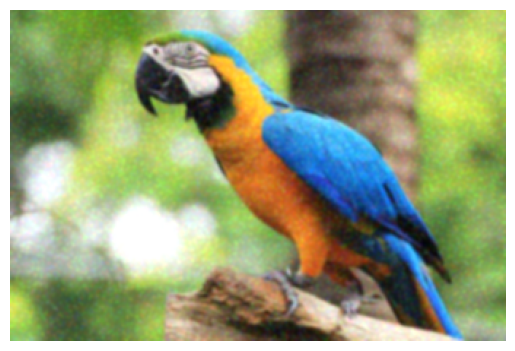

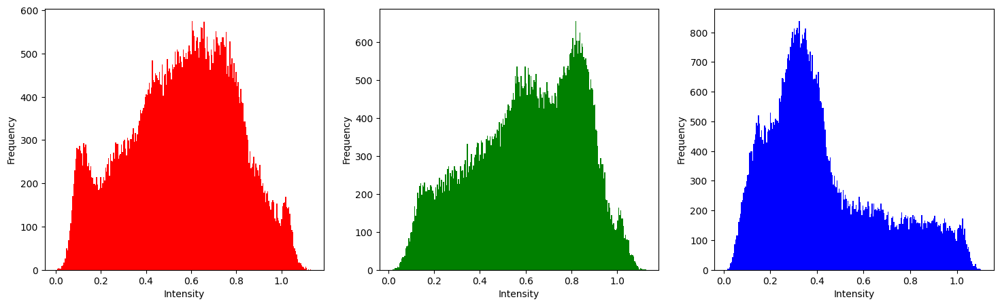

In [ ]:
def gkernel(l=3, sig=2):
    """\
    Gaussian Kernel Creator via given length and sigma
    """

    ax = np.linspace(-(l - 1) / 2., (l - 1) / 2., l)
    xx, yy = np.meshgrid(ax, ax)

    kernel = np.exp(-0.5 * (np.square(xx) + np.square(yy)) / np.square(sig))

    return kernel / np.sum(kernel)

kernal = gkernel(l=5, sig= 1.0)

# plt.imshow(kernal)
# plt.axis('off')
# plt.show()
print(kernal)

for image in [parrot_image]:

  h, w, c = image.shape
  image = image / 255.0 + (np.random.rand(h, w, c) > 0.75) * np.random.rand(h, w, c) * 0.3

  draw_color_image_and_hist(image)

  filtered_image = filter_by_kernal(image, kernal)
  draw_color_image_and_hist(filtered_image)

# Підвищення контрастності

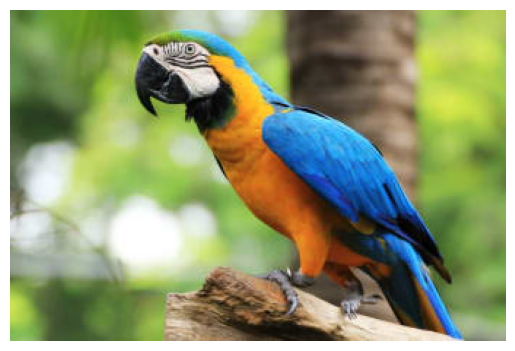

In [ ]:
plt.imshow(parrot_image)
plt.axis('off')
plt.show()

[[-0.06999341 -0.06957522 -0.06829646 -0.06957522 -0.06999341]
 [-0.06957522 -0.04260162  0.03987824 -0.04260162 -0.06957522]
 [-0.06829646  0.03987824  2.12065477  0.03987824 -0.06829646]
 [-0.06957522 -0.04260162  0.03987824 -0.04260162 -0.06957522]
 [-0.06999341 -0.06957522 -0.06829646 -0.06957522 -0.06999341]] 1.0


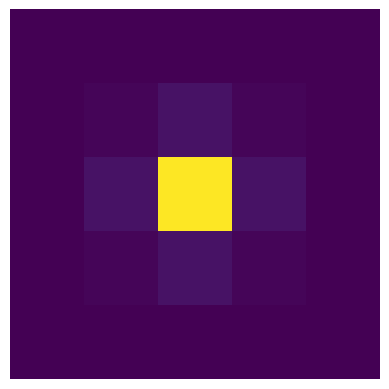

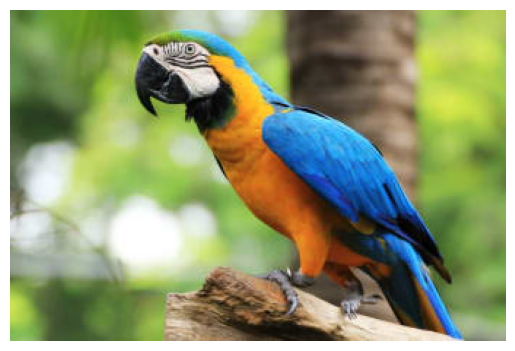

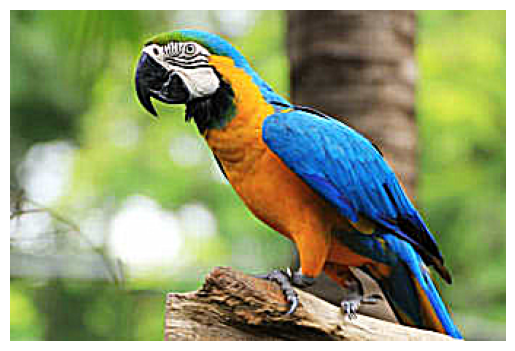

In [ ]:
# kernal = np.array([[-1, -2, -1],
#                    [-2, 22, -2],
#                    [-1, -2, -1]]) / 10.0

kernal = gkernel(5, 0.6) - 0.07
kernal[2, 2] = 1.0 - kernal.sum() + kernal[2, 2]
print(kernal, kernal.sum())

plt.imshow(kernal)
plt.axis('off')
plt.show()

plt.imshow(parrot_image)
plt.axis('off')
plt.show()

contrast_image = filter_by_kernal(parrot_image / 255.0, kernal)

plt.imshow(contrast_image)
plt.axis('off')
plt.show()


# Корекція освітленості

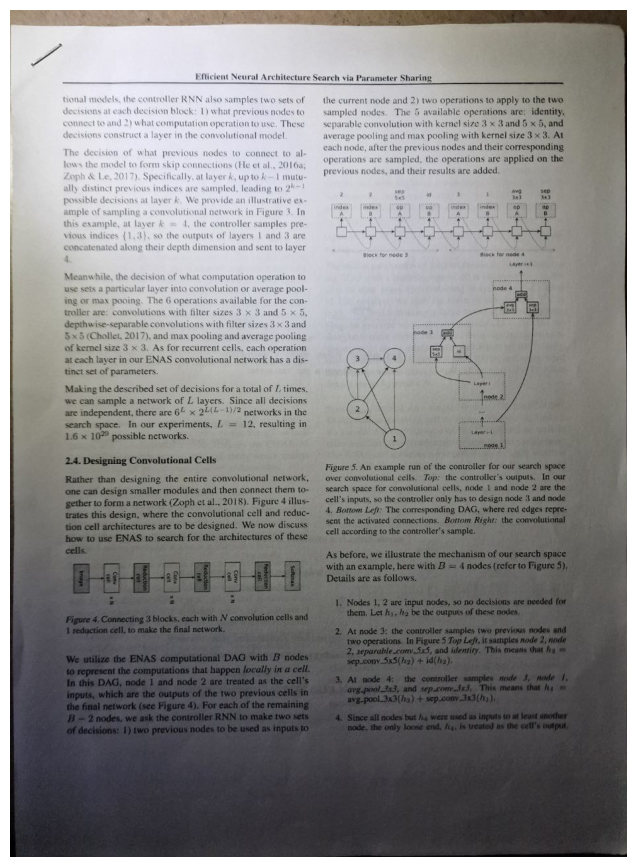

In [ ]:
text_image = plt.imread(os.path.join(root_path, r"images/text.jpg")) / 255.0
# text_image = cv2.cvtColor(text_image, cv2.COLOR_RGB2GRAY)

# text_image = cv2.resize(text_image,
#                 (text_image.shape[1] // 2, text_image.shape[0] // 2)) / 255.0

plt.figure(figsize=(11, 11))
plt.imshow(text_image, cmap="gray")
plt.axis('off')
plt.show()

(160, 116, 3)


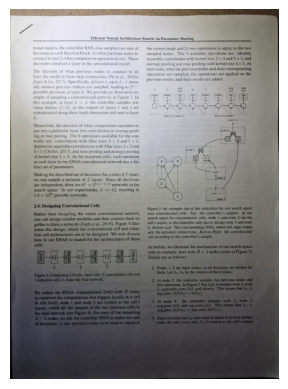

In [ ]:
text_image.shape


text_image_copy = cv2.resize(text_image,
                (text_image.shape[1] // 8, text_image.shape[0] // 8))
print(text_image_copy.shape)

plt.imshow(text_image, cmap="gray")
plt.axis('off')
plt.show()

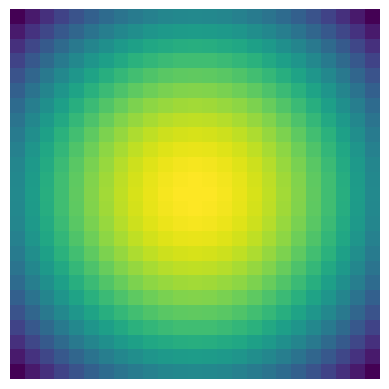

In [ ]:
kernal = gkernel(l=25, sig= 25.0)

plt.imshow(kernal)
plt.axis('off')
plt.show()

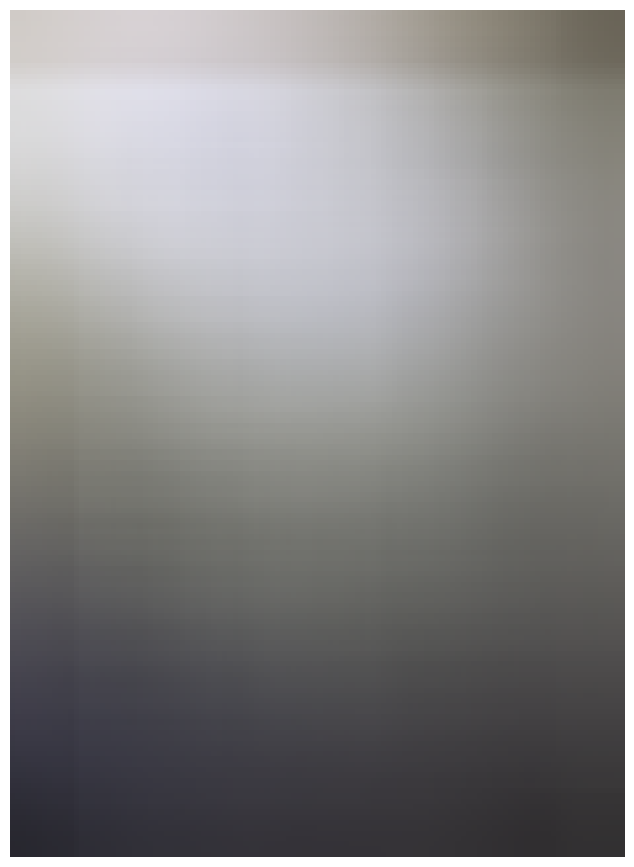

In [ ]:
color_map = filter_by_kernal(text_image_copy, kernal)

plt.figure(figsize=(11, 11))
plt.imshow(color_map, cmap="gray")
plt.axis('off')
plt.show()

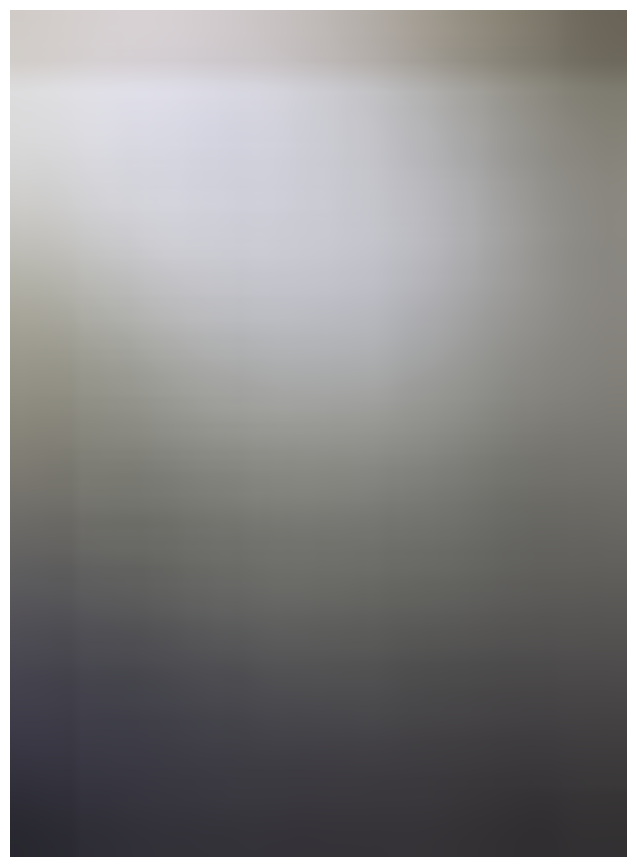

In [ ]:
color_map = cv2.resize(color_map, (text_image.shape[1], text_image.shape[0]))

plt.figure(figsize=(11, 11))
plt.imshow(color_map, cmap="gray")
plt.axis('off')
plt.show()

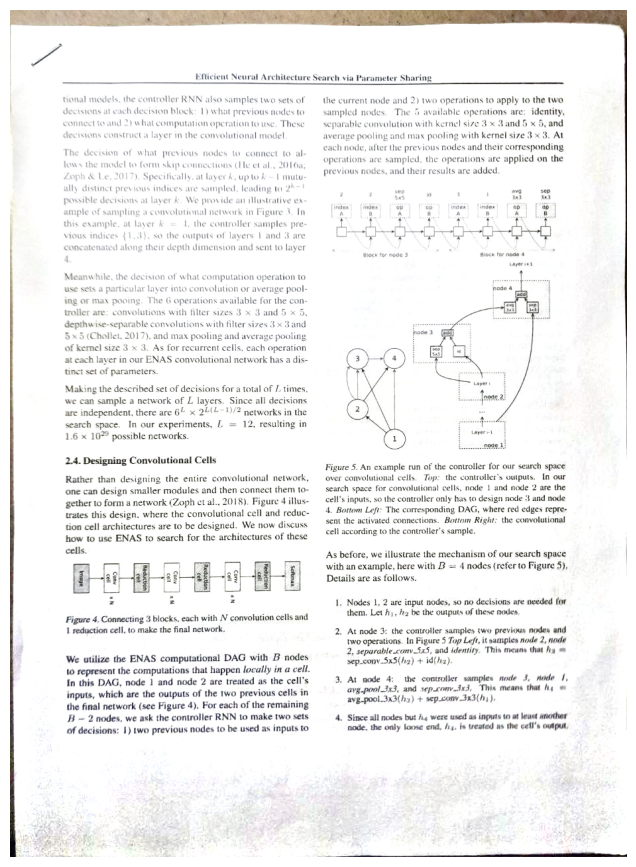

In [ ]:
color_map = cv2.resize(color_map, (text_image.shape[1], text_image.shape[0]))

color_corrected_image = text_image / color_map

plt.figure(figsize=(11, 11))
plt.imshow(color_corrected_image, cmap="gray")
plt.axis('off')
plt.show()

[[-0.04       -0.03999627 -0.04      ]
 [-0.03999627  1.16998509 -0.03999627]
 [-0.04       -0.03999627 -0.04      ]] 0.8500000000000001


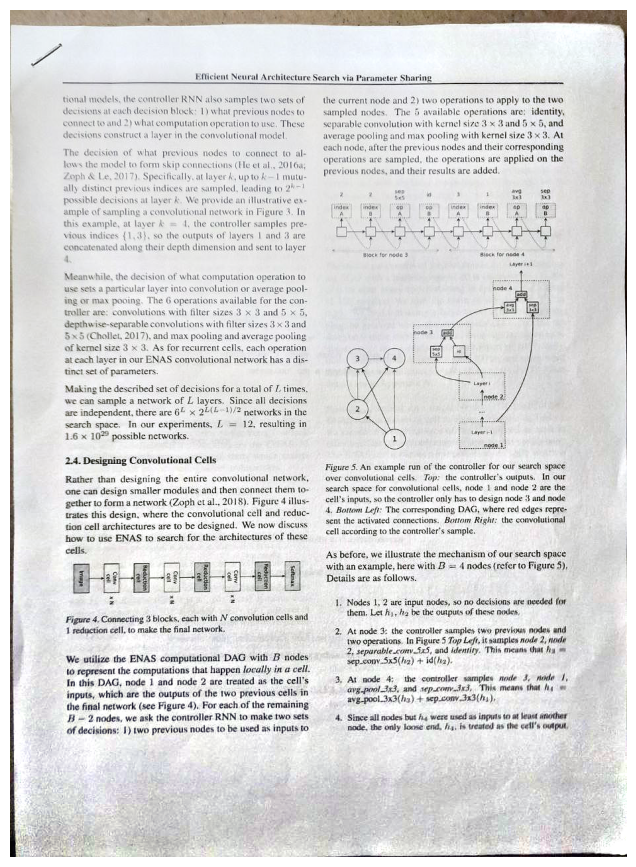

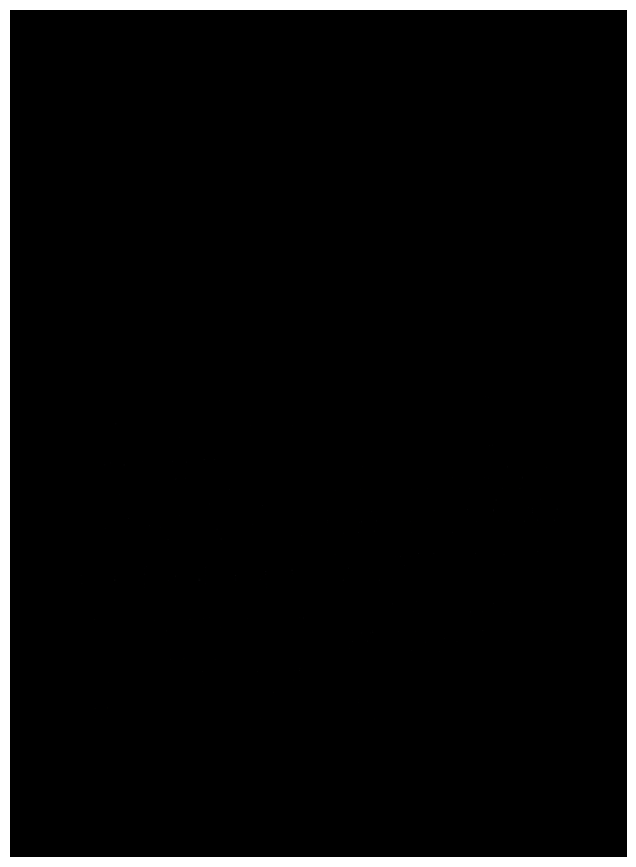

In [ ]:
kernal = gkernel(3, 0.2) - 0.04
kernal[1, 1] = 1.0 - kernal.sum() + kernal[1, 1] - 0.15
print(kernal, kernal.sum())

cotrast_corrected_image = filter_by_kernal(color_corrected_image, kernal)

plt.figure(figsize=(11, 11))
plt.imshow(cotrast_corrected_image, cmap="gray")
plt.axis('off')
plt.show()

plt.figure(figsize=(11, 11))
plt.imshow(cotrast_corrected_image - color_corrected_image, cmap="gray")
plt.axis('off')
plt.show()

In [ ]:
cotrast_corrected_image = (cotrast_corrected_image - cotrast_corrected_image.min()) / (cotrast_corrected_image.max() - cotrast_corrected_image.min())

In [ ]:
cotrast_corrected_image.min(), cotrast_corrected_image.max()

(0.0, 1.0)

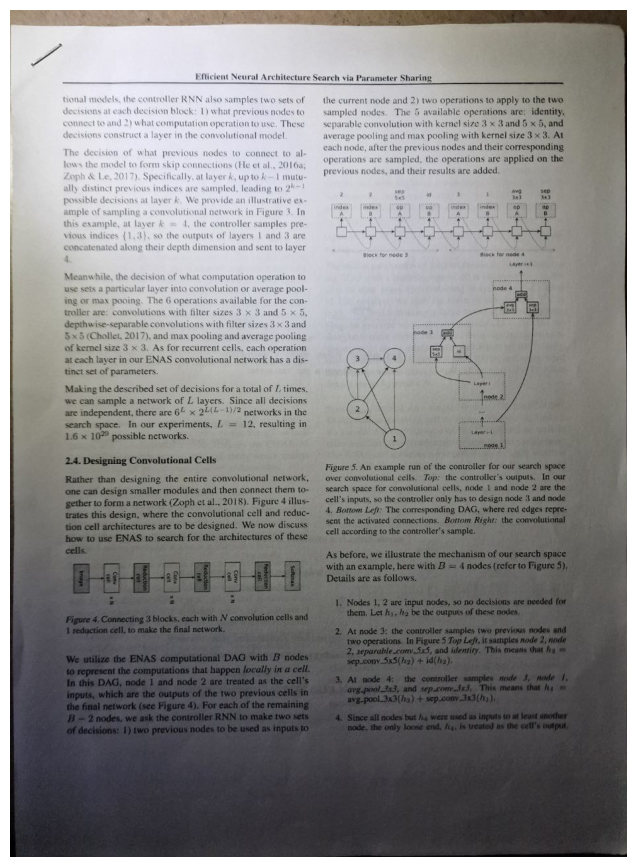

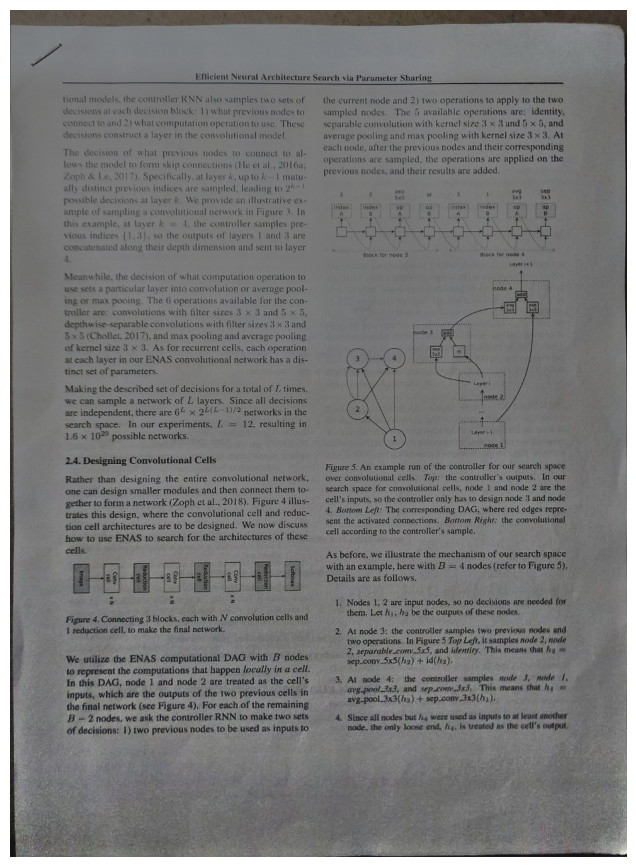

In [ ]:
final_image = adjust_gamma((cotrast_corrected_image * 255.0).astype(np.uint8), 0.8)

plt.figure(figsize=(11, 11))
plt.imshow(text_image, cmap="gray")
plt.axis('off')
plt.show()

plt.figure(figsize=(11, 11))
plt.imshow(final_image, cmap="gray")
plt.axis('off')
plt.show()

